# PUNCH Top-20 — Full Tab 1 + Gaia Prediction Comparison

**Purpose:** Run the **complete MEE GUI Tab 1** (stack → centroids → plate solve → outputs) on the raw
February 2026 PUNCH frame, extract the **20 brightest observed centroids**, project the
**20 brightest Gaia stars** into the image through the PUNCH WCS, and overlay both on the real
image for a visual match check.

| Setting | Value |
|---------|-------|
| Input | `PUNCH_L3_CAM_20260219001600_v0j_MEE.fits` (Feb 19, 2026) |
| Corona mask | OFF (raw image) |
| Tab 1 | FULL run (`do_stack()` incl. plate solve attempt) |
| `sigma_thresh` / `min_area` | 10 / 2 |
| `N_TOP` | 20 (both observed + Gaia) |
| Gaia query pool | G < 6.0, trimmed to 20 brightest in frame |
| Markers | **orange open circles** = observed, **cyan open squares** = Gaia predicted |
| Output | `Coronagraph Runs/punch_top20/` |

**Run order:** Setup → Config → Validate → Full Tab 1 → Results → Top-20 observed →
Gaia top-20 predicted → Comparison plot.

**Note:** plate solve is expected to FAIL on PUNCH (logged, non-fatal). The Gaia WCS
projection is the validation path.

---
## Setup: Import Libraries and Initialize
Initializes the star-catalog triangle database — required for the plate-solve stage of the full Tab 1 run.

In [ ]:
# ============================================================================
# IMPORTS + DATABASE INIT
# ============================================================================
import os
import sys
from pathlib import Path

import numpy as np
import pandas as pd

from astropy.io import fits

from mee2024 import stacker_implementation
from mee2024 import database_cache

import matplotlib.pyplot as plt
%matplotlib inline

print("Initializing star catalog database (needed for plate solve)...")
database_cache.prepare_triangles()
print("Database ready!")


Initializing star catalog database (needed for plate solve)...
preparing
Database ready!
working on loading triangles


preloaded triangles
finished preparation work


---
## Config
Everything you might want to tweak lives here.

In [6]:
# ============================================================================
# CONFIG — PUNCH top-20 run (FULL Tab 1, no corona mask)
# ============================================================================
from pathlib import Path

PROJECT_ROOT = Path("/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder")

# Input: February 2026 PUNCH frame (MEE-ready FITS: science array in primary HDU)
zenith_light_files = [
    str(PROJECT_ROOT / "PUNCH_L3_CAM_20260219001600_v0j_MEE.fits"),
]
zenith_dark_files = []
zenith_flat_files = []

output_directory = str(PROJECT_ROOT / "Coronagraph Runs" / "punch_top20")
Path(output_directory).mkdir(parents=True, exist_ok=True)

# Top-N for BOTH observed centroids and predicted Gaia stars
N_TOP = 20

# Gaia query pool: query catalog down to this G magnitude, then keep the
# 20 brightest that land inside the frame
GAIA_QUERY_MAG_LIMIT = 6.0

# Environment for matplotlib/sunpy caches
os.environ.setdefault("MPLCONFIGDIR", str(PROJECT_ROOT / ".mplconfig"))
os.environ.setdefault("SUNPY_CONFIGDIR", str(PROJECT_ROOT / ".sunpy"))

# ---------------------------------------------------------------------------
# Full Tab 1 settings (same as GUI Tab 1)
# ---------------------------------------------------------------------------
TAB1_SETTINGS = {
    'flag_display': True,
    'save_dark_flat': False,
    'float_fits': False,
    'd': 200,                          # how many brightest stars to mark on Tab 1's own plot

    # MEE's saturation blob mask does not fire on PUNCH (Sun is a zero-hole,
    # not a saturated blob) — left OFF; raw image goes in untouched.
    'delete_saturated_blob': False,
    'blob_saturation_level': 95,
    'blob_radius_extra': 350,
    'centroid_gap_blob': 175,

    # Sensitive centroid finding
    'centroid_gaussian_subtract': True,
    'sensitive_mode_stack': True,
    'centroid_gaussian_thresh': 10.0,
    'min_area': 40,
    'sigma_subtract': 0.0,
    'background_subtraction_mode': 'annular',

    'remove_edgy_centroids': False,
}

TAB1_DO_NOT_TOUCH = {
    'm': 30, 'n': 30, 'pxl_tol': 10, 'cutoff': 100,
    'img_edge_distance': 5, 'rough_match_threshhold': 36,
    'sanity_check_centroids': True,
    'experimental_background_subtract': False,
    'workDir': '', 'workDir2': '', '-DARK-': '', '-FLAT-': '',
    'database': '', 'flag_debug': False, 'flag_display2': False,
}

options = {**TAB1_DO_NOT_TOUCH, **TAB1_SETTINGS, 'output_dir': output_directory}

print("Config loaded — FULL Tab 1 run (stack + centroids + plate solve)")
print(f"  Input FITS : {zenith_light_files[0]}")
print(f"  Output dir : {output_directory}")
print(f"  sigma_thresh={options['centroid_gaussian_thresh']}, min_area={options['min_area']}, blob=OFF, corona mask=OFF")
print(f"  N_TOP={N_TOP}, Gaia query pool G<{GAIA_QUERY_MAG_LIMIT}")


Config loaded — FULL Tab 1 run (stack + centroids + plate solve)
  Input FITS : /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/PUNCH_L3_CAM_20260219001600_v0j_MEE.fits
  Output dir : /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20
  sigma_thresh=10.0, min_area=40, blob=OFF, corona mask=OFF
  N_TOP=20, Gaia query pool G<6.0


### Validate Input Files

In [7]:
# ============================================================================
# FILE VALIDATION
# ============================================================================
import os

def validate_files(file_list, file_type="light"):
    valid_files = []
    for file_path in file_list:
        if not file_path:
            continue
        if not os.path.exists(file_path):
            print(f"WARNING: {file_type} file not found: {file_path}")
            continue
        try:
            with open(file_path, 'rb') as f:
                pass
            valid_files.append(file_path)
            print(f"Valid {file_type} file: {os.path.basename(file_path)}")
        except Exception as e:
            print(f"ERROR: cannot open {file_type} file {file_path}: {e}")
    return valid_files

valid_zenith_light_files = validate_files(zenith_light_files, "light")
valid_zenith_dark_files = validate_files(zenith_dark_files, "dark")
valid_zenith_flat_files = validate_files(zenith_flat_files, "flat")

if len(valid_zenith_light_files) == 0:
    raise ValueError("No valid light files. Check paths in the Config cell.")
print("Validation complete — ready to run full Tab 1.")


Valid light file: PUNCH_L3_CAM_20260219001600_v0j_MEE.fits
Validation complete — ready to run full Tab 1.


---
## Run FULL Tab 1

Calls `stacker_implementation.do_stack()` — the exact GUI Tab 1 engine, end to end:

1. Open + preprocess frames (dark/flat if given, blob mask if enabled)
2. Find centroids on each frame
3. Align + stack frames
4. Find centroids on the stacked image (sensitive mode)
5. Filter junk (edges, artifacts, sanity checks)
6. **Plate solve attempt** (triangle matching vs catalog — expected to FAIL on PUNCH, non-fatal)
7. Save everything: `STACKED*.fit`, `centroid_data*.zip`, plots, log, `results.txt`

May take several minutes.

FULL TAB 1: STACK + CENTROIDS + PLATE SOLVE
logpath /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20/CENTROID_OUTPUT20260703211530/LOG20260703211530.txt
using version:v0.6.0
using options:{'m': 30, 'n': 30, 'pxl_tol': 10, 'cutoff': 100, 'img_edge_distance': 5, 'rough_match_threshhold': 36, 'sanity_check_centroids': True, 'experimental_background_subtract': False, 'workDir': '', 'workDir2': '', '-DARK-': '', '-FLAT-': '', 'database': '', 'flag_debug': False, 'flag_display2': False, 'flag_display': True, 'save_dark_flat': False, 'float_fits': False, 'd': 200, 'delete_saturated_blob': False, 'blob_saturation_level': 95, 'blob_radius_extra': 350, 'centroid_gap_blob': 175, 'centroid_gaussian_subtract': True, 'sensitive_mode_stack': True, 'centroid_gaussian_thresh': 10.0, 'min_area': 40, 'sigma_subtract': 0.0, 'background_subtraction_mode': 'annular', 'remove_edgy_centroids': False, 'output_dir': '/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024

/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:477: RuntimeWarning: invalid value encountered in sqrt
  data = np.maximum(sub / np.sqrt(local_variance) - options['sigma_subtract'], 0)
/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:477: RuntimeWarning: invalid value encountered in divide
  data = np.maximum(sub / np.sqrt(local_variance) - options['sigma_subtract'], 0)


--- 9.666774988174438 seconds for centroid finding (prepare)---
--- 9.861899852752686 seconds for centroid finding (labelling)---
n centroids initial 20
n centroids sanity-filtered 19
--- 10.056473016738892 seconds for centroid finding (all)---
found: [(np.float64(10518.356956524494), np.float64(187.0), (np.float64(2098.6369901626517), np.float64(1267.6113418200414))), (np.float64(7787.065396043219), np.float64(158.0), (np.float64(1999.2233414780148), np.float64(1580.4447498638215))), (np.float64(5018.735184765751), np.float64(66.0), (np.float64(3358.308728553735), np.float64(3231.2492496008435))), (np.float64(4222.540321417038), np.float64(47.0), (np.float64(243.51680834402205), np.float64(1416.162174850343))), (np.float64(3513.2377036842345), np.float64(60.0), (np.float64(459.0400793791354), np.float64(2287.6229405698327))), (np.float64(2897.2200437630495), np.float64(42.0), (np.float64(3449.6282476690926), np.float64(3252.000216139385))), (np.float64(2860.4754317098864), np.float64(

/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/.venv/lib/python3.12/site-packages/skimage/measure/_regionprops.py:723: RuntimeWarning: invalid value encountered in scalar divide
  tuple(M[_get_element(axis)] / M0 for axis in range(self._ndim))


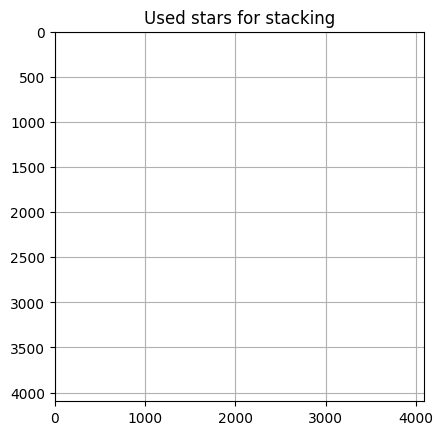

/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:719: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")


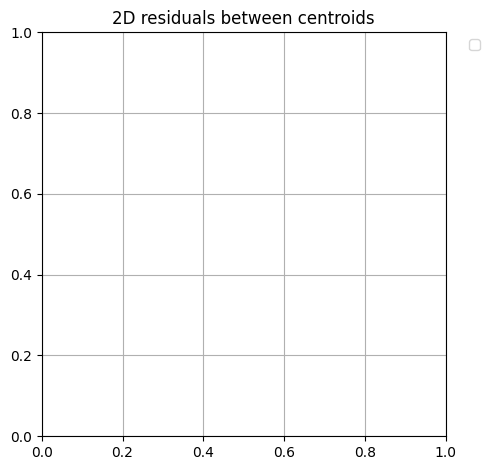

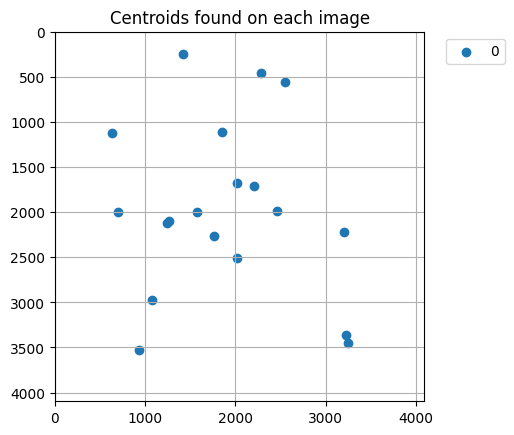

Stacking images...
  1/1


/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:477: RuntimeWarning: invalid value encountered in sqrt
  data = np.maximum(sub / np.sqrt(local_variance) - options['sigma_subtract'], 0)
/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/mee2024/stacker_implementation.py:477: RuntimeWarning: invalid value encountered in divide
  data = np.maximum(sub / np.sqrt(local_variance) - options['sigma_subtract'], 0)


--- 9.872306108474731 seconds for centroid finding (prepare)---
--- 10.283626079559326 seconds for centroid finding (labelling)---
n centroids initial 20
n centroids sanity-filtered 19
--- 10.423752069473267 seconds for centroid finding (all)---
found: [(np.float64(10518.356956524494), np.float64(187.0), (np.float64(2098.6369901626517), np.float64(1267.6113418200414))), (np.float64(7787.065396043219), np.float64(158.0), (np.float64(1999.2233414780148), np.float64(1580.4447498638215))), (np.float64(5018.735184765751), np.float64(66.0), (np.float64(3358.308728553735), np.float64(3231.2492496008435))), (np.float64(4222.540321417038), np.float64(47.0), (np.float64(243.51680834402205), np.float64(1416.162174850343))), (np.float64(3513.2377036842345), np.float64(60.0), (np.float64(459.0400793791354), np.float64(2287.6229405698327))), (np.float64(2897.2200437630495), np.float64(42.0), (np.float64(3449.6282476690926), np.float64(3252.000216139385))), (np.float64(2860.4754317098864), np.float64

/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/.venv/lib/python3.12/site-packages/skimage/measure/_regionprops.py:723: RuntimeWarning: invalid value encountered in scalar divide
  tuple(M[_get_element(axis)] / M0 for axis in range(self._ndim))


 Real time prepare: 1.40 seconds
 Real time match: 0.18 seconds
 Real time platescale compute: 0.66 seconds
initial triangle matches: 774238
triangle match: 4 [(0, 5, 6), (0, 5, 10), (0, 10, 6), (5, 10, 6)]
note: candidate match rejected (nstars matched = 4, thresh = 12)
triangle match: 4 [(0, 5, 13), (0, 5, 15), (0, 13, 15), (5, 15, 13)]
note: candidate match rejected (nstars matched = 3, thresh = 13)
triangle match: 4 [(1, 4, 11), (1, 4, 13), (1, 13, 11), (4, 13, 11)]
note: candidate match rejected (nstars matched = 2, thresh = 10)
triangle match: 4 [(2, 6, 14), (6, 9, 2), (6, 13, 2), (6, 9, 14)]
note: candidate match rejected (nstars matched = 4, thresh = 15)
triangle match: 4 [(3, 14, 4), (3, 16, 4), (3, 14, 16), (4, 14, 16)]
note: candidate match rejected (nstars matched = 4, thresh = 12)
triangle match: 4 [(4, 6, 5), (4, 5, 7), (4, 6, 7), (5, 7, 6)]
note: candidate match rejected (nstars matched = 5, thresh = 15)
triangle match: 4 [(4, 6, 5), (4, 5, 8), (4, 6, 8), (5, 8, 6)]
note

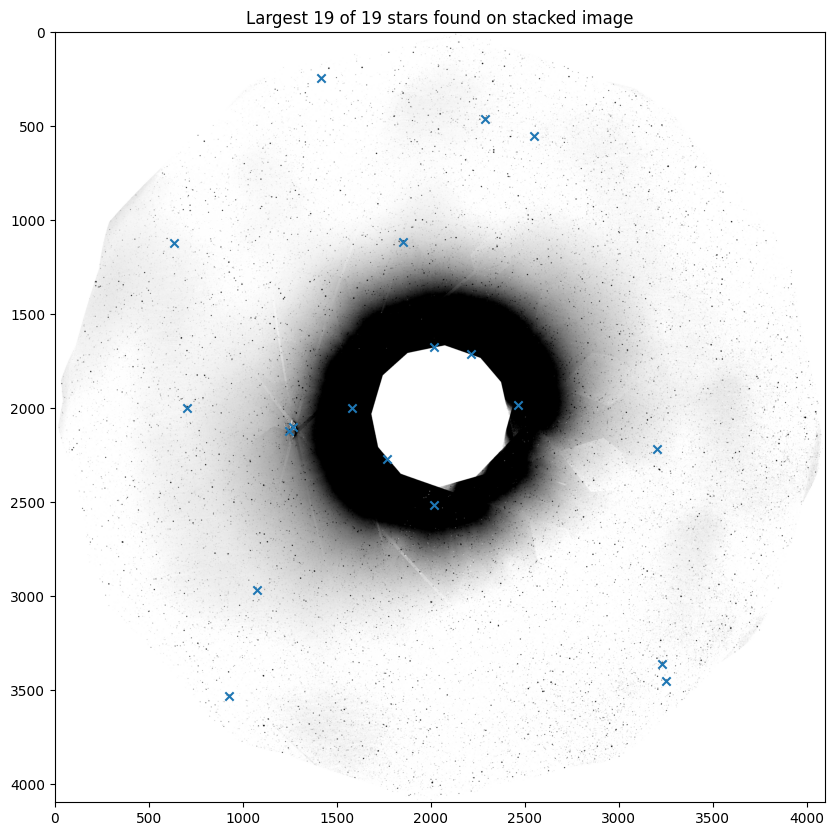

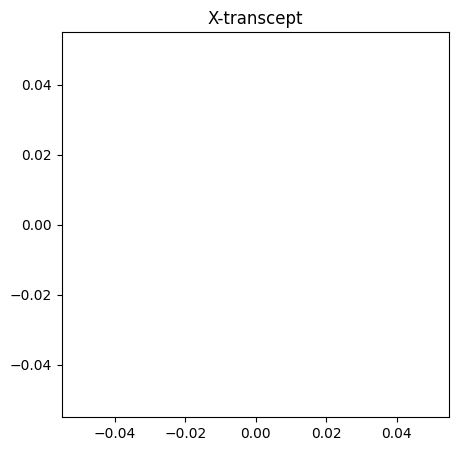

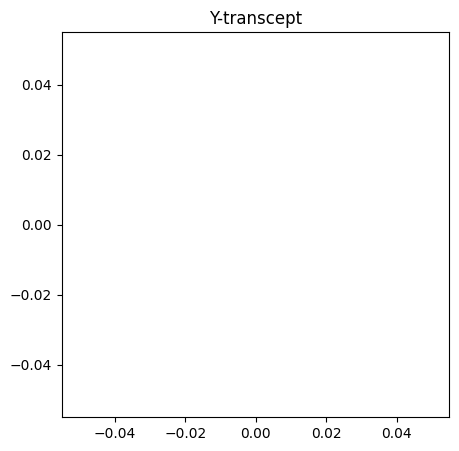

making archive /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20/CENTROID_OUTPUT20260703211530 /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20
Done!

SUCCESS — full Tab 1 run complete.
Output directory: /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20
(If you saw 'ERROR: platesolve failed to identify location' above,
 that is the expected PUNCH result — everything else still completed.)


<Figure size 640x480 with 0 Axes>

In [8]:
# ============================================================================
# RUN FULL TAB 1 — do_stack()
# ============================================================================
print("=" * 60)
print("FULL TAB 1: STACK + CENTROIDS + PLATE SOLVE")
print("=" * 60)

try:
    stacker_implementation.do_stack(
        valid_zenith_light_files,
        valid_zenith_dark_files,
        valid_zenith_flat_files,
        options,
    )
    print()
    print("SUCCESS — full Tab 1 run complete.")
    print(f"Output directory: {output_directory}")
    print("(If you saw 'ERROR: platesolve failed to identify location' above,")
    print(" that is the expected PUNCH result — everything else still completed.)")
except Exception as e:
    print(f"ERROR during Tab 1 run: {e}")
    raise


### Tab 1 Results
Locates the newest output, displays the Step-1 plots inline, and prints `results.txt`
(including the plate-solve outcome).

ZIP    : centroid_data20260703211530.zip  (0.00 MB)
Folder : CENTROID_OUTPUT20260703211530
CSV    : /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20/CENTROID_OUTPUT20260703211530/data/STACKED_CENTROIDS_DATA.csv

results.txt:
  MEE2024 version       : v0.6.0
  platesolved           : False
  n_centroids           : 19
  RA                    : None
  DEC                   : None
  roll                  : None
  platescale/arcsec     : None

USEDSTARS20260703211530.png


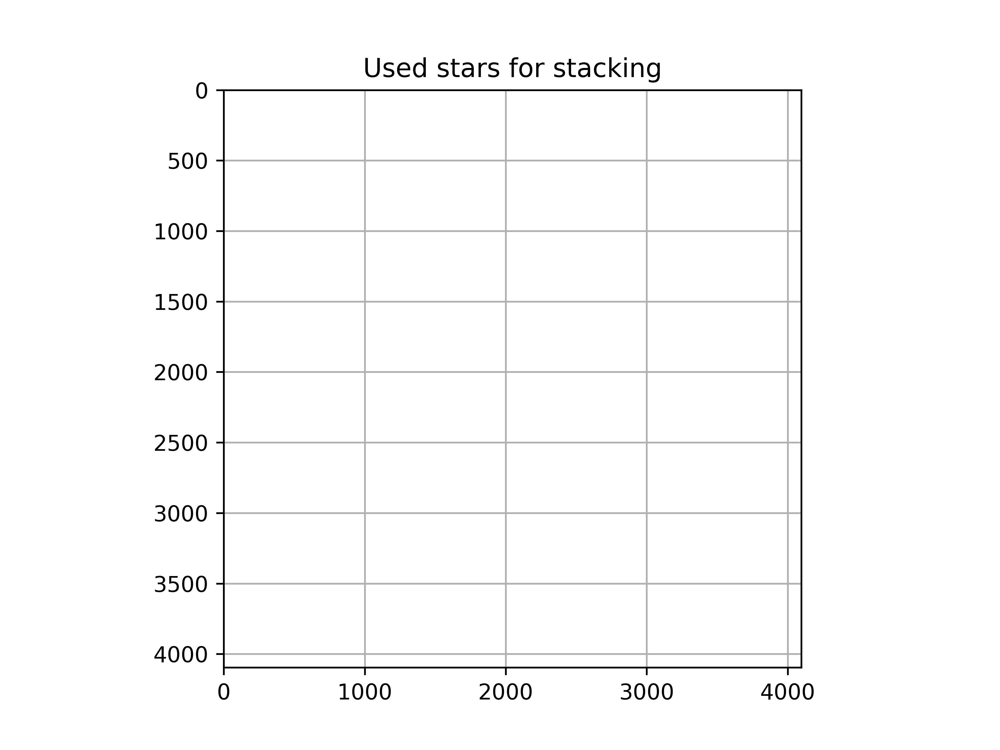

TWOD_RESIDUALS20260703211530.png


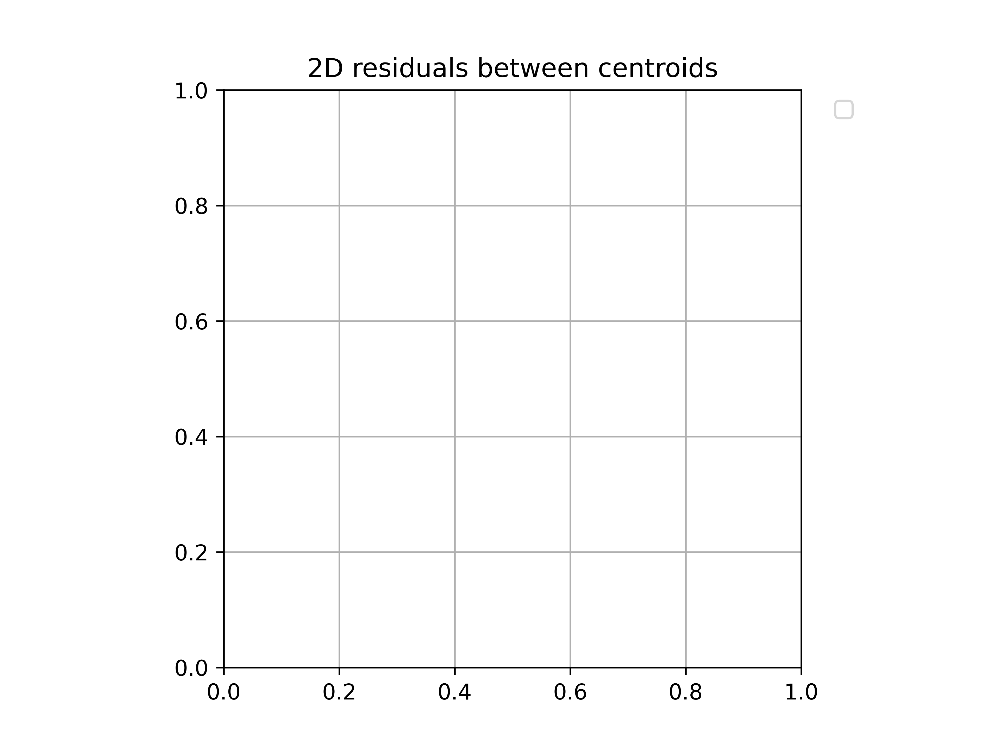

CentroidsALL20260703211530.png


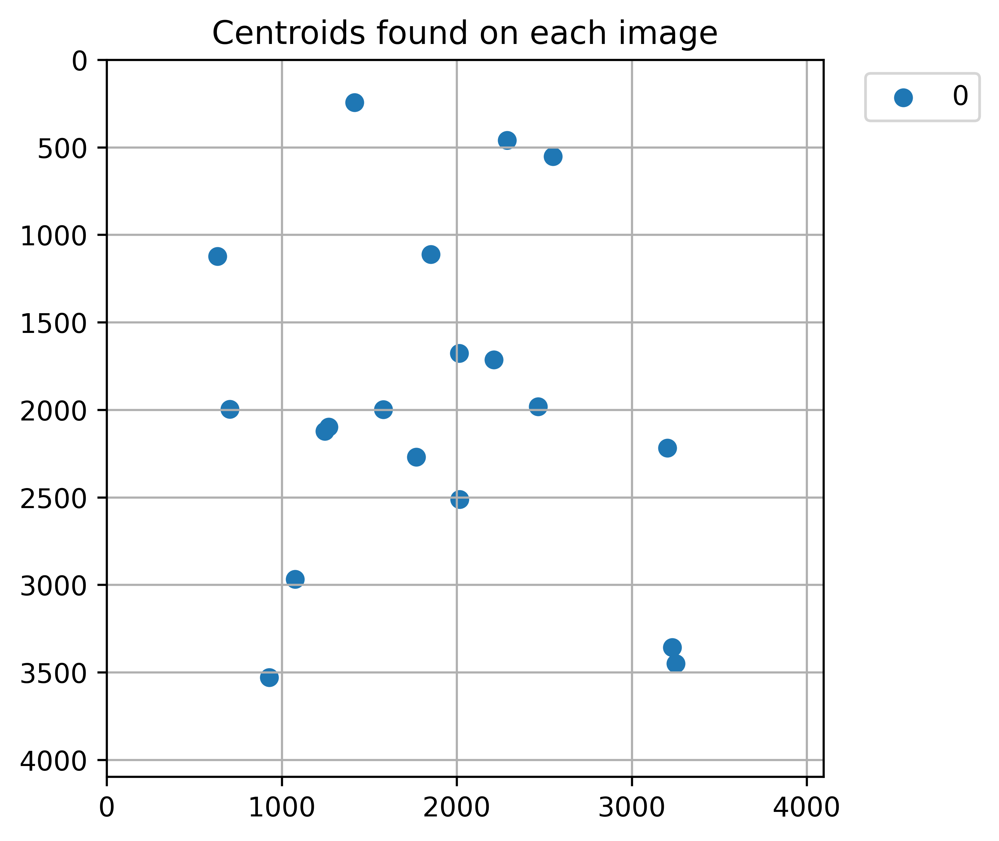

CentroidsStackGood20260703211530.png


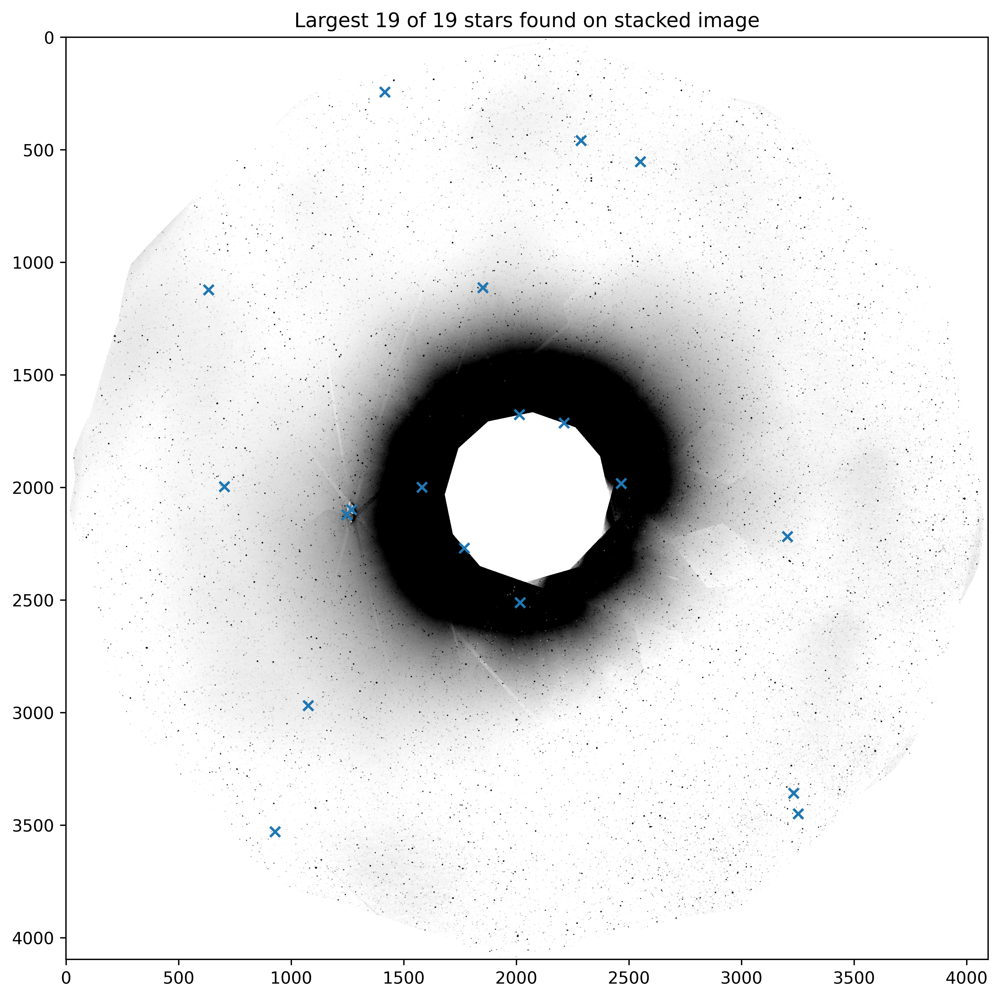

In [9]:
# ============================================================================
# TAB 1 OUTPUTS — files, plots, results.txt
# ============================================================================
import json
from pathlib import Path
try:
    from IPython.display import display, Image
except Exception:
    display = Image = None

output_path = Path(output_directory)
centroid_zips = sorted(output_path.glob("centroid_data*.zip"), key=lambda x: x.stat().st_mtime, reverse=True)
output_dirs = sorted([p for p in output_path.glob("CENTROID_OUTPUT*") if p.is_dir()],
                     key=lambda x: x.stat().st_mtime, reverse=True)

if not centroid_zips or not output_dirs:
    raise RuntimeError(f"No Tab 1 outputs found in {output_path} — did the run complete?")

step1_output_file = str(centroid_zips[0])
step1_output_dir = output_dirs[0]
CENTROID_CSV_ALL = step1_output_dir / "data" / "STACKED_CENTROIDS_DATA.csv"

print(f"ZIP    : {centroid_zips[0].name}  ({centroid_zips[0].stat().st_size/(1024*1024):.2f} MB)")
print(f"Folder : {step1_output_dir.name}")
print(f"CSV    : {CENTROID_CSV_ALL}")

# results.txt — includes plate solve outcome
results_path = step1_output_dir / "data" / "results.txt"
if results_path.exists():
    results = json.loads(results_path.read_text())
    print()
    print("results.txt:")
    for k in ["MEE2024 version", "platesolved", "n_centroids", "RA", "DEC", "roll", "platescale/arcsec"]:
        print(f"  {k:22s}: {results.get(k)}")

# Show Tab 1's own plots
print()
for stem in ["USEDSTARS", "TWOD_RESIDUALS", "CentroidsALL", "CentroidsStackGood"]:
    matches = sorted(step1_output_dir.glob(f"{stem}*.png"), key=lambda p: p.stat().st_mtime, reverse=True)
    if not matches:
        print(f"(missing) {stem}*.png")
        continue
    print(matches[0].name)
    if display and Image:
        display(Image(filename=str(matches[0])))


---
## Top-20 Observed Centroids
The 20 brightest detections by noise-normalized flux, from the full Tab 1 centroid list.

In [10]:
# ============================================================================
# TOP-20 OBSERVED CENTROIDS
# ============================================================================
import pandas as pd

_all = pd.read_csv(CENTROID_CSV_ALL, index_col=0)
_flux_col = "flux (noise-normed)"
top20_obs = _all.sort_values(_flux_col, ascending=False).head(N_TOP).copy()
top20_obs.insert(0, "rank", range(1, len(top20_obs) + 1))
top20_obs = top20_obs.reset_index(drop=True)

TOP20_OBS_CSV = str(Path(output_directory) / "TOP20_CENTROIDS.csv")
top20_obs.to_csv(TOP20_OBS_CSV, index=False)

print(f"Total centroids from Tab 1 : {len(_all)}")
print(f"Top {N_TOP} by flux saved -> {TOP20_OBS_CSV}")
print()
print(top20_obs[["rank", "px", "py", "area (pixels)", _flux_col]].to_string(index=False))


Total centroids from Tab 1 : 19
Top 20 by flux saved -> /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20/TOP20_CENTROIDS.csv

 rank          px          py  area (pixels)  flux (noise-normed)
    1 1267.611342 2098.636990          187.0         10518.356957
    2 1580.444750 1999.223341          158.0          7787.065396
    3 3231.249250 3358.308729           66.0          5018.735185
    4 1416.162175  243.516808           47.0          4222.540321
    5 2287.622941  459.040079           60.0          3513.237704
    6 3252.000216 3449.628248           42.0          2897.220044
    7  927.918137 3528.923251           49.0          2860.475432
    8  702.665481 1995.952073           63.0          2850.578806
    9 1246.276685 2121.372382           81.0          2813.853999
   10 1850.878935 1112.609683           54.0          2169.986702
   11 2550.321230  552.921997           53.0          2147.288323
   12  633.324232 1122.519382        

---
## Top-20 Predicted Gaia Stars

Uses the PUNCH WCS (via SunPy) as the coordinate translator: query the Gaia catalog around
the Sun's apparent position, shift each star to the observation date (proper motion), convert
ICRS → helioprojective → pixel, keep the stars that land inside the frame, and take the
**20 brightest by G magnitude**. *(Needs internet for the Gaia query.)*

In [11]:
# ============================================================================
# GAIA — query, project through PUNCH WCS, keep 20 brightest in frame
# ============================================================================
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Distance, get_sun
from astropy.time import Time
import sunpy.map
import sunpy.coordinates  # registers Helioprojective <-> ICRS transforms
from astroquery.gaia import Gaia

PUNCH_WCS_FITS = str(PROJECT_ROOT / "PUNCH_L3_CAM_20260219001600_v0j_MEE.fits")

def _load_punch_map(path):
    m = sunpy.map.Map(path)
    if isinstance(m, (list, tuple)):
        m = m[0]
    return m

punch_map = _load_punch_map(PUNCH_WCS_FITS)
print("SunPy map:", punch_map.date, punch_map.data.shape)

# Search center = Sun's apparent ICRS position (helioprojective origin is unstable)
sun_icrs = get_sun(punch_map.date)
center_ra, center_dec = float(sun_icrs.ra.deg), float(sun_icrs.dec.deg)

# Cone radius from plate scale
_cdelt_deg = float(punch_map.scale[0].to_value(u.deg / u.pix))
_ny, _nx = punch_map.data.shape
SEARCH_RADIUS_DEG = 0.5 * np.hypot(_nx, _ny) * _cdelt_deg + 2.0
print(f"Gaia cone: RA={center_ra:.3f} Dec={center_dec:.3f} radius={SEARCH_RADIUS_DEG:.1f} deg")

_q = (
    "SELECT ra, dec, phot_g_mean_mag, parallax, pmra, pmdec, radial_velocity, ref_epoch "
    "FROM gaiadr3.gaia_source "
    f"WHERE phot_g_mean_mag < {GAIA_QUERY_MAG_LIMIT} "
    f"AND CONTAINS(POINT('ICRS', ra, dec), "
    f"CIRCLE('ICRS', {center_ra}, {center_dec}, {SEARCH_RADIUS_DEG})) = 1"
)
print("Submitting Gaia query...")
gaia = Gaia.launch_job_async(_q).get_results()
print(f"Gaia returned {len(gaia)} stars with G < {GAIA_QUERY_MAG_LIMIT}")

def _col(name, fill=0.0):
    a = np.ma.getdata(gaia[name]).astype(float)
    m = np.ma.getmaskarray(gaia[name])
    return np.where(m | ~np.isfinite(a), fill, a)

_plx = _col('parallax', fill=1e-3)
_plx = np.where(_plx > 1e-3, _plx, 1e-3)

_crds = SkyCoord(
    ra=_col('ra') * u.deg, dec=_col('dec') * u.deg,
    distance=Distance(parallax=_plx * u.mas),
    pm_ra_cosdec=_col('pmra') * (u.mas / u.yr),
    pm_dec=_col('pmdec') * (u.mas / u.yr),
    radial_velocity=_col('radial_velocity') * (u.km / u.s),
    frame='icrs',
    obstime=Time(_col('ref_epoch', fill=2016.0), format='jyear'),
)
_now = _crds.apply_space_motion(new_obstime=punch_map.date)
_gx, _gy = punch_map.world_to_pixel(_now)
gaia_px_all = np.asarray(_gx.value if hasattr(_gx, "value") else _gx, dtype=float)
gaia_py_all = np.asarray(_gy.value if hasattr(_gy, "value") else _gy, dtype=float)
gaia_mag_all = np.asarray(gaia['phot_g_mean_mag'], dtype=float)

_in = (gaia_px_all >= 0) & (gaia_px_all < _nx) & (gaia_py_all >= 0) & (gaia_py_all < _ny)
print(f"Stars landing inside the frame: {int(_in.sum())}")

_order = np.argsort(gaia_mag_all[_in])            # brightest (lowest G) first
_sel = np.nonzero(_in)[0][_order][:N_TOP]

top20_gaia = pd.DataFrame({
    "rank": range(1, len(_sel) + 1),
    "gaia_G_mag": gaia_mag_all[_sel],
    "pred_px": gaia_px_all[_sel],
    "pred_py": gaia_py_all[_sel],
    "ra_deg": _col('ra')[_sel],
    "dec_deg": _col('dec')[_sel],
})

TOP20_GAIA_CSV = str(Path(output_directory) / "TOP20_GAIA_PREDICTED.csv")
top20_gaia.to_csv(TOP20_GAIA_CSV, index=False)
print(f"Top {N_TOP} brightest Gaia stars in frame saved -> {TOP20_GAIA_CSV}")
print()
print(top20_gaia.to_string(index=False))


SunPy map: 2026-02-19T00:16:00.000 (4096, 4096)
Gaia cone: RA=332.076 Dec=-11.475 radius=67.2 deg
Submitting Gaia query...
INFO: Query finished. [astroquery.utils.tap.core]
Gaia returned 1922 stars with G < 6.0
Stars landing inside the frame: 1105
Top 20 brightest Gaia stars in frame saved -> /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20/TOP20_GAIA_PREDICTED.csv

 rank  gaia_G_mag     pred_px     pred_py     ra_deg    dec_deg
    1    1.773280 2550.568402  552.331152 332.059078 -46.961617
    2    2.089978 1415.791292  242.641524   6.572156 -42.307820
    3    2.223692 3252.534135 3450.706087 296.564986  10.613253
    4    2.503658 1075.099954 2967.431811 346.190507  15.205083
    5    2.712085 2350.952850 2420.370997 322.889803  -5.571211
    6    2.725079 1110.350834 3688.453425 340.750640  30.221130
    7    2.727835 1915.736285 2525.867476 331.446064  -0.319897
    8    2.803014 3991.727473 2050.214077 287.440968 -21.023779
    9    2

/Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/.venv/lib/python3.12/site-packages/erfa/core.py:133: ErfaWarning: ERFA function "pmsafe" yielded 1 of "distance overridden (Note 6)"
  warn(f'ERFA function "{func_name}" yielded {wmsg}', ErfaWarning)


---
## Comparison Plot

The real PUNCH image, untouched, with:

- **orange open circles** — the 20 brightest *observed* centroids
- **cyan open squares** — the 20 brightest *predicted* Gaia positions

No matching, no annotations on the stars — where a square and a circle enclose the same
dot of light, that's a visual hit.

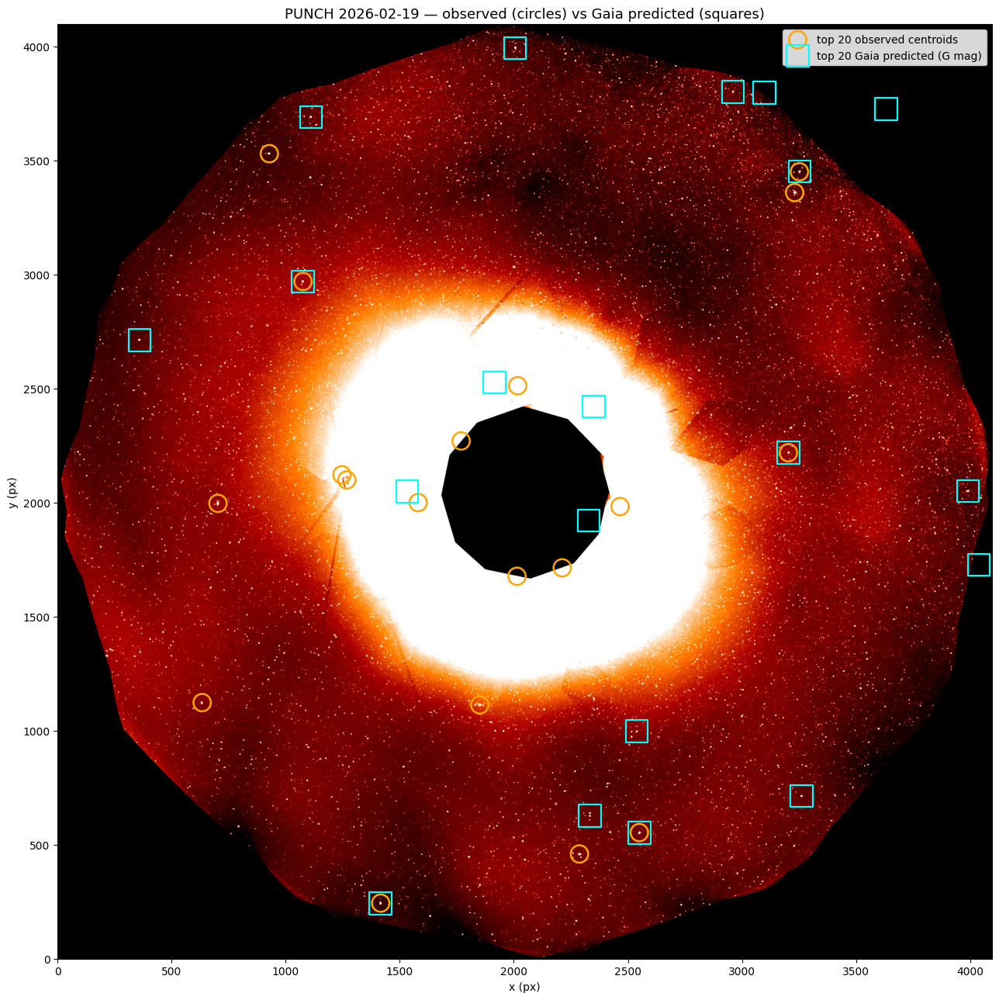

Saved /Users/jassim/Desktop/MEE 2024 Coronagraph/MEE2024_HussainKinder/Coronagraph Runs/punch_top20/PUNCH_top20_comparison_20260703_211737.png


In [12]:
# ============================================================================
# COMPARISON PLOT — observed circles vs Gaia squares on the real image
# ============================================================================
from datetime import datetime
import matplotlib.pyplot as plt
from astropy.visualization import AsinhStretch, ImageNormalize, PercentileInterval
import sunpy.visualization.colormaps  # registers stereocor2

_img = punch_map.data.astype(float)
_cmap = plt.get_cmap("stereocor2")
_norm = ImageNormalize(_img, interval=PercentileInterval(99.0), stretch=AsinhStretch())

fig, ax = plt.subplots(figsize=(13, 13))
ax.imshow(_img, origin="lower", cmap=_cmap, norm=_norm)

# observed: orange open circles
ax.scatter(top20_obs["px"], top20_obs["py"],
           marker="o", s=260, facecolors="none", edgecolors="orange",
           linewidths=1.8, label=f"top {N_TOP} observed centroids")

# Gaia predicted: cyan open squares (slightly larger so nested pairs read clearly)
ax.scatter(top20_gaia["pred_px"], top20_gaia["pred_py"],
           marker="s", s=420, facecolors="none", edgecolors="cyan",
           linewidths=1.6, label=f"top {N_TOP} Gaia predicted (G mag)")

ax.set_title(f"PUNCH {punch_map.date.strftime('%Y-%m-%d')} — observed (circles) vs Gaia predicted (squares)",
             fontsize=13)
ax.set_xlabel("x (px)"); ax.set_ylabel("y (px)")
ax.set_xlim(0, _img.shape[1]); ax.set_ylim(0, _img.shape[0])
ax.legend(loc="upper right", framealpha=0.85)
plt.tight_layout()

_stamp = datetime.now().strftime("%Y%m%d_%H%M%S")
_out = Path(output_directory) / f"PUNCH_top20_comparison_{_stamp}.png"
plt.savefig(_out, dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved {_out}")


---
## (Parked) Deflection vs Radius

Next stage, after visual inspection of the comparison plot: pair each observed centroid with
its Gaia prediction, convert the offsets to arcseconds through the WCS (`SphericalScreen`
needed for off-disk stars), remove any global shift/rotation, take the **radial component**,
and plot against distance from Sun center in solar radii with the Einstein curve
\(1.751/r\) arcsec overlaid.

**Reality check for PUNCH:** nearest stars sit at ~50–80 R☉ where the Einstein deflection is
~0.02–0.03″, while the measurement noise is ~25″ (≈0.3 px at 81″/px). The plot demonstrates
the *method*; a real measurement of L needs COR1-class data (stars at 1.3–4 R☉, finer plate
scale). Say the word and this stage gets built.